In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import cv2
from PIL import Image
from osgeo import gdal

import os
import glob
import random

from skimage.metrics import structural_similarity as ssim
from sewar.full_ref import rmse, psnr, uqi, ergas, scc, rase, sam, vifp
from tqdm import tqdm

In [2]:
# Global variables
global channels 
channels = ['Coastal Aerosol','Blue','Green',
            'Red','Red Edge 1','Red Edge 2',
            'Red Edge 3','NIR','Red Edge 4',
            'Water Vapour','SWIR 1','SWIR 2']

In [3]:
def get_rgb(img):
    #Return normalized RGB channels from sentinel image
    
    rgb_img = img[:, :, [3,2,1]]
    rgb_normalize = np.clip(rgb_img/10000, 0, 0.3)/0.3
    
    return rgb_normalize

def load_test(path):
    #Returns sentinel image, RGB image, and label
    img = gdal.Open(path).ReadAsArray()
    stack_img = np.stack(img, axis=-1)
    rgb_img = get_rgb(stack_img)
    
    label_path = path.replace("images", "labels").replace("image", "label")
    label = gdal.Open(label_path).ReadAsArray()
    
    return stack_img, rgb_img, label

def channel_filter(img, c=0):
   #Returns given channel from image
    img = np.array(img)
    c_img = img[:, :, c]
    return c_img

def plot_channels(img,invert=False,path=None):
    #Plot all channels of a given image
    
    global channels

    fig, axs = plt.subplots(3,4,figsize=(15,10))

    index = 0
    for i in range(3):
        for j in range(4):
            c_img = channel_filter(img,c=index)
            if invert:
                c_img = 255-c_img

            axs[i,j].imshow(c_img,cmap='gray')
            axs[i,j].set_title(channels[index],size=20)
            axs[i,j].set_xticks([])
            axs[i,j].set_yticks([])

            index +=1

    if path != None:
        plt.savefig(path, bbox_inches='tight')

def preprocess(img_input, toggle=[True, True, False]):
    #Preprocess image for edge detection
    #toggle: [Equalized histogram, Gaussian blur, Morphological closing]

    img = np.array(img_input, dtype=np.uint8)

    # Iterate over bands
    for i in range(12):
        img_i = img[:, :, i]

        # Scale bands between 0 and 255
        img[:, :, i] = cv2.normalize(img_i, None, 0, 255, cv2.NORM_MINMAX)

        # Equalized histogram
        if toggle[0]:
            img_i = cv2.equalizeHist(img[:, :, i])
            img[:, :, i] = img_i

        # Gaussian blur
        if toggle[1]:
            kernel = (5, 5)
            img_i = cv2.GaussianBlur(img[:, :, i], kernel, 0)
            img[:, :, i] = img_i

        # Morphological closing
        if toggle[2]:
            kernel = np.ones((5, 5), np.uint8)
            img_i = cv2.morphologyEx(img[:, :, i], cv2.MORPH_CLOSE, kernel)
            img[:, :, i] = img_i

    return img

def canny_ed(img_input, threshold1=100, threshold2=200):
    #Apply canny edge detection to image
    img = np.array(img_input, dtype=np.uint8)
    edges = np.zeros_like(img)

    for i in range(img.shape[2]):
        edges[:, :, i] = cv2.Canny(img[:, :, i], threshold1, threshold2)

    return edges

def scharr_ed(img_input):
   #Apply scharr edge detection to image
    img = np.array(img_input, dtype=np.uint8)
    edges = np.zeros_like(img)

    for i in range(img.shape[2]):
        schx = cv2.Scharr(img[:, :, i], cv2.CV_8U, 1, 0)
        schy = cv2.Scharr(img[:, :, i], cv2.CV_8U, 0, 1)
        edges[:, :, i] = schx + schy

    return edges

def sobel_ed(img_input):
   #Apply sobel edge detection to image
    img = np.array(img_input, dtype=np.uint8)
    edges = np.zeros_like(img)

    for i in range(img.shape[2]):
        sobelx = cv2.Sobel(img[:, :, i], cv2.CV_8U, 1, 0, ksize=5)
        sobely = cv2.Sobel(img[:, :, i], cv2.CV_8U, 0, 1, ksize=5)
        edges[:, :, i] = sobelx + sobely

    return edges    

def prewitt_ed(img_input):
   #Apply prewitt edge detection to image
    img = np.array(img_input, dtype=np.uint8)
    edges = np.zeros_like(img)

    kx = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]) 
    ky = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])

    for i in range(img.shape[2]):
        prewittx = cv2.filter2D(img[:, :, i], -1, kx)
        prewitty = cv2.filter2D(img[:, :, i], -1, ky)
        edges[:, :, i] = prewittx + prewitty

    return edges

def plot_all_channels(input_data, title, path=None):
    fig, axs = plt.subplots(3, 4, figsize=(15, 10))
    for i in range(12):
        ax = axs[i // 4, i % 4]
        ax.imshow(input_data[:, :, i], cmap='gray')
        ax.set_title(f"{title} - Channel {i}")
        ax.axis("off")
    plt.tight_layout()
    if path:
        plt.savefig(path, bbox_inches='tight')
    plt.show()

def rmse(ref_img, img):
    return np.sqrt(np.mean((ref_img - img) ** 2))

def psnr(ref_img, img):
    mse = np.mean((ref_img - img) ** 2)
    if mse == 0:
        return float('inf')
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))

def uqi(ref_img, img):
    # Placeholder function for UQI calculation
    if np.mean(img) == 0:
        return 0
    return np.mean(ref_img) / np.mean(img)

In [4]:
# Load images and labels
test_path = glob.glob("../data/SWED/test/images/*")
print(test_path[0])
print(len(test_path))

# Load all images
input_images = []
rgb_images = []
labels = []

for path in test_path:
    try:
        img, rgb_img, label = load_test(path)
        input_images.append(img)
        rgb_images.append(rgb_img)
        labels.append(label)
    except Exception as e:
        print(f"Error with image {path}: {e}")

# Apply Canny to binary maps
canny_input = [np.uint8(img * 255) for img in labels]
edge_reference = [cv2.Canny(img, threshold1=100, threshold2=200) for img in canny_input]

# Display the first image path and the total number of images
print(f"First image path: {test_path[0]}")
print(f"Total number of images: {len(test_path)}")

# Sense checks
print("Lengths:",len(input_images), len(labels), len(rgb_images), len(edge_reference))
print("Input:", np.min(input_images[0]),np.max(input_images[0]))
print("RGB:", np.min(rgb_images[0]),np.max(rgb_images[0]))
print(len(rgb_images[0][0][0]))
print("Labels:",np.min(labels[0]),np.max(labels[0]))
print("Edge reference:",np.min(edge_reference),np.max(edge_reference))

../data/SWED/test/images/S2A_MSIL2A_20200107T175721_N0213_R141_T12QVM_20200107T214721_image_0_0.tif
98


/usr/lib/python3/dist-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


First image path: ../data/SWED/test/images/S2A_MSIL2A_20200107T175721_N0213_R141_T12QVM_20200107T214721_image_0_0.tif
Total number of images: 98
Lengths: 98 98 98 98
Input: 1 5424
RGB: 0.0003333333333333334 1.0
3
Labels: 0 1
Edge reference: 0 255


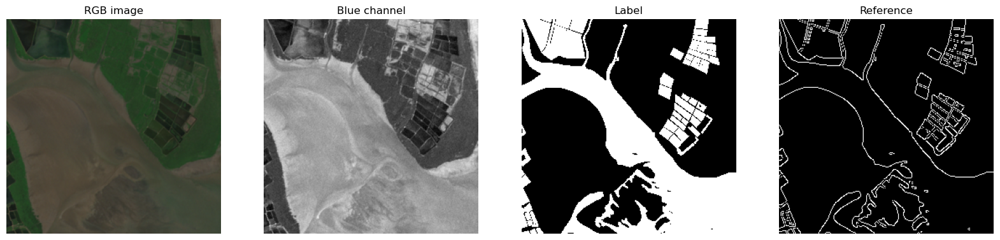

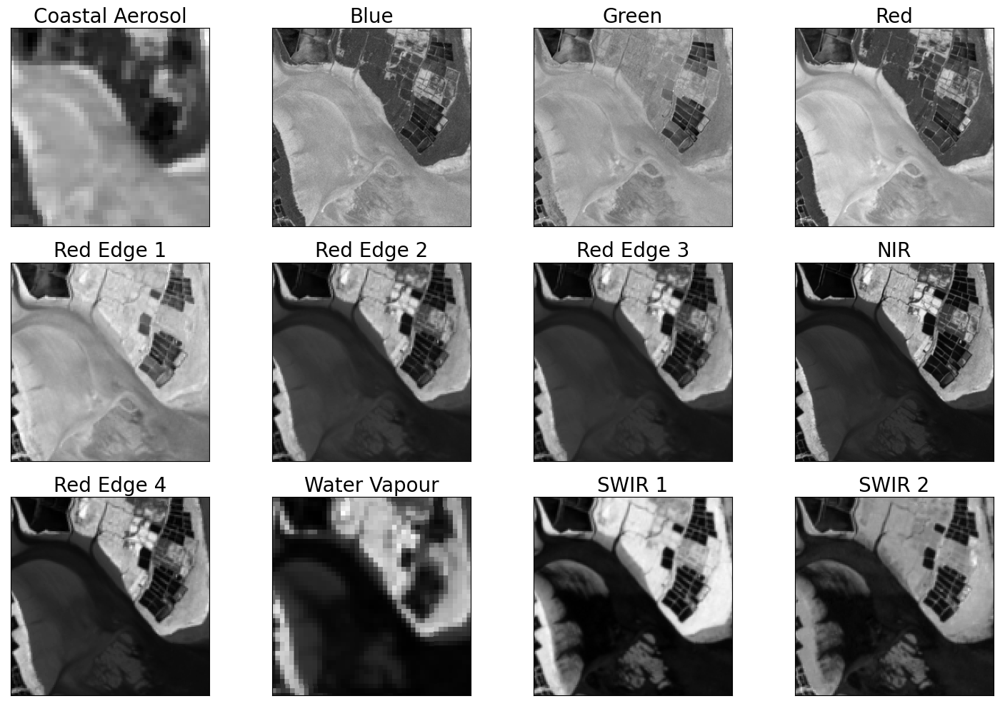

In [5]:
# Generate a random integer within the range of your dataset
rint = random.randint(0, len(rgb_images) - 1)

# Create a figure with 4 subplots
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# Plot the RGB image
axs[0].imshow(rgb_images[rint])
axs[0].set_title("RGB image")
axs[0].axis("off")

# Plot the blue channel
axs[1].imshow(input_images[rint][:, :, 1], cmap="gray")
axs[1].set_title("Blue channel")
axs[1].axis("off")

# Plot the label
axs[2].imshow(labels[rint], cmap="gray")
axs[2].set_title("Label")
axs[2].axis("off")

# Plot the edge reference
axs[3].imshow(edge_reference[rint], cmap="gray")
axs[3].set_title("Reference")
axs[3].axis("off")

# Plot all channels
plot_channels(input_images[rint])

# Display the figure
plt.tight_layout()
plt.show()

Random index: 78


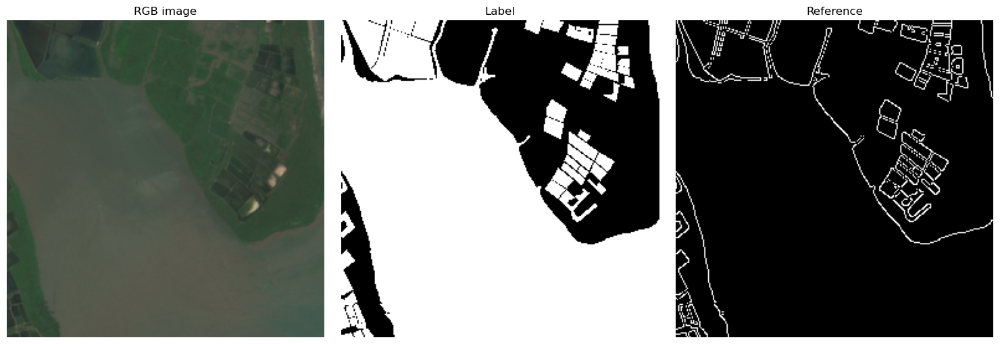

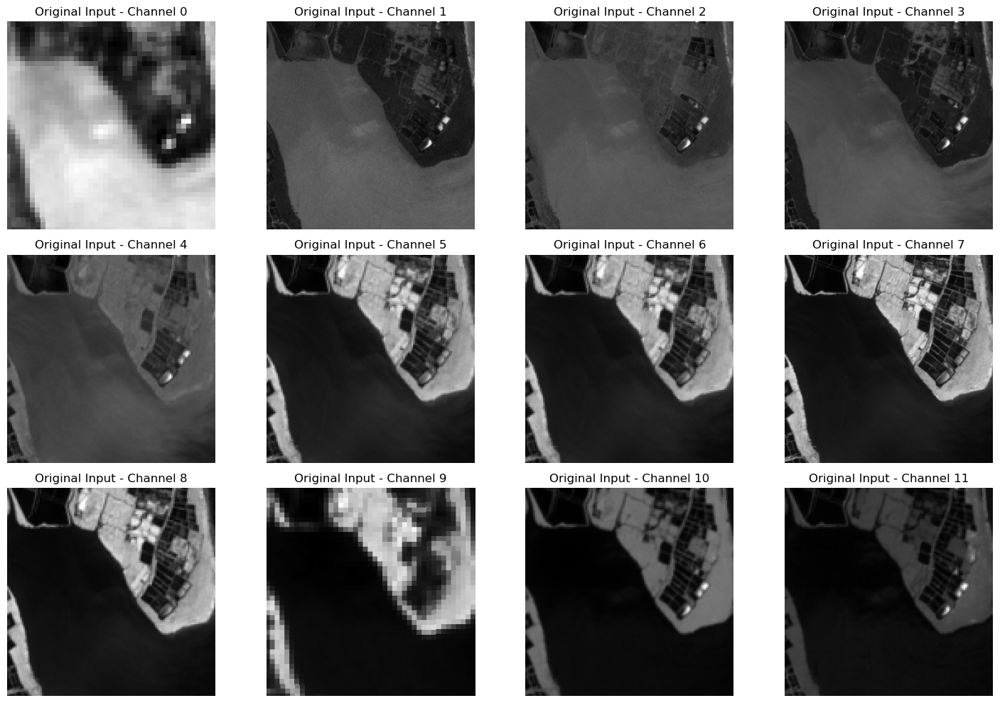

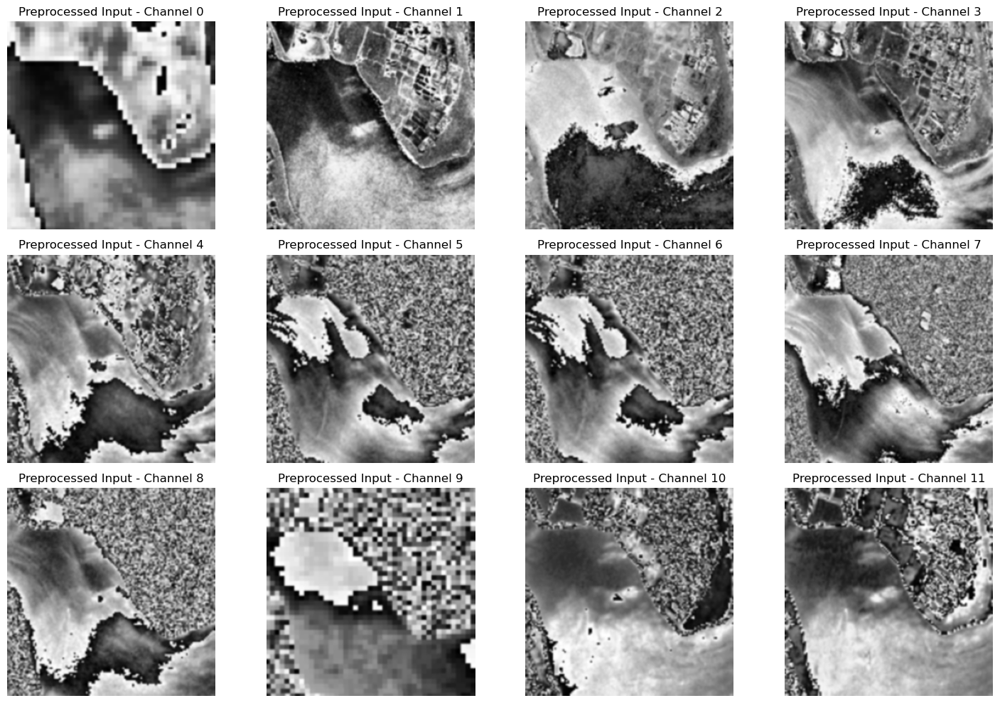

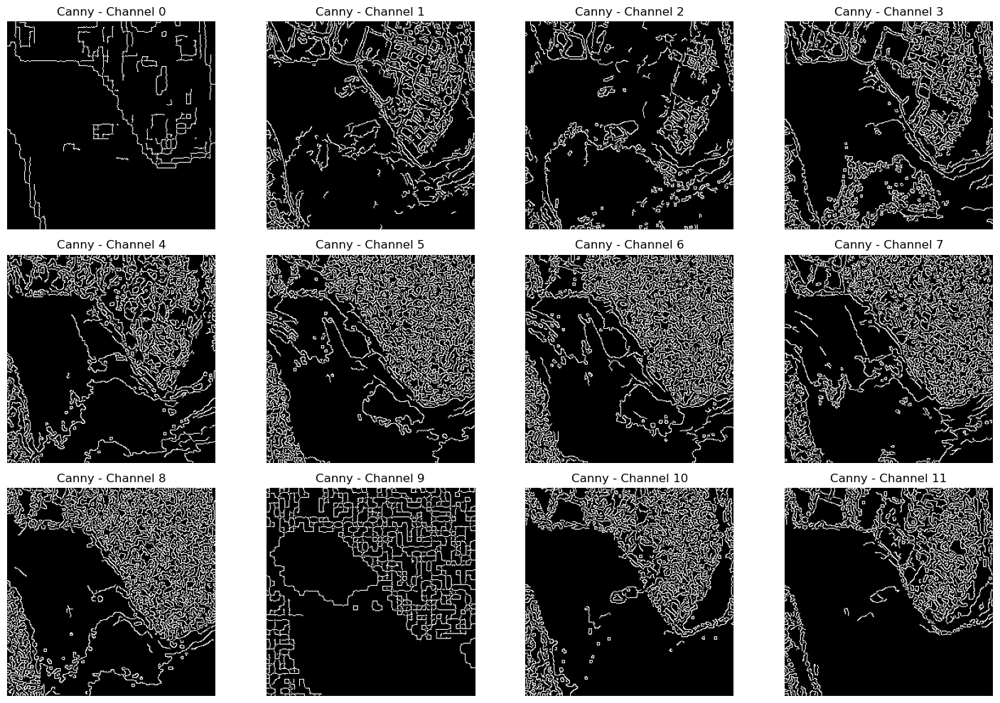

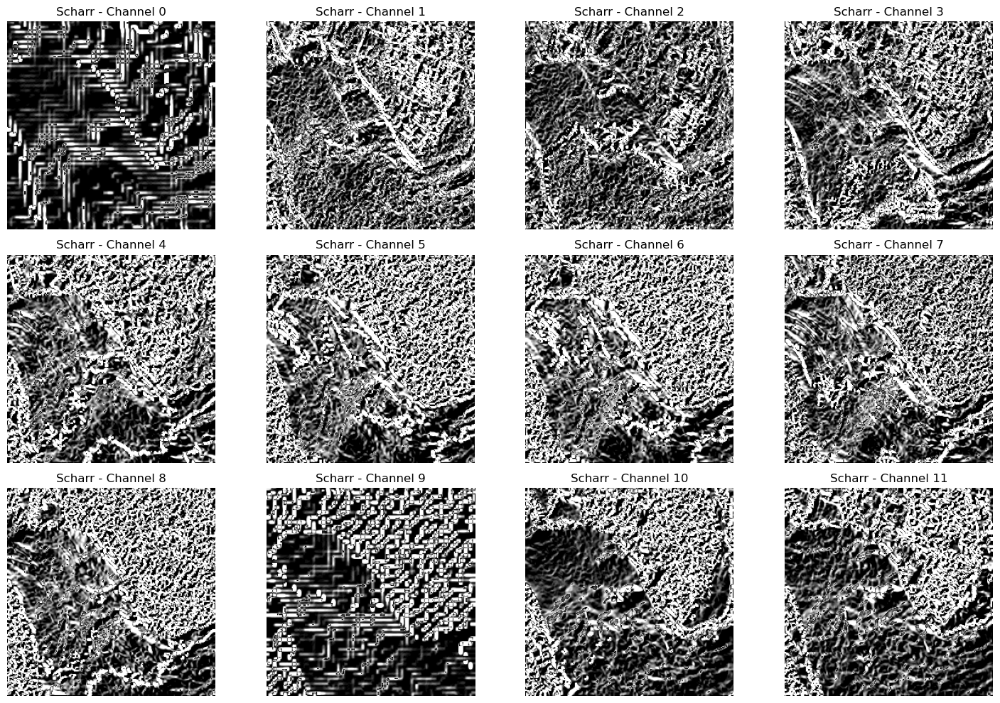

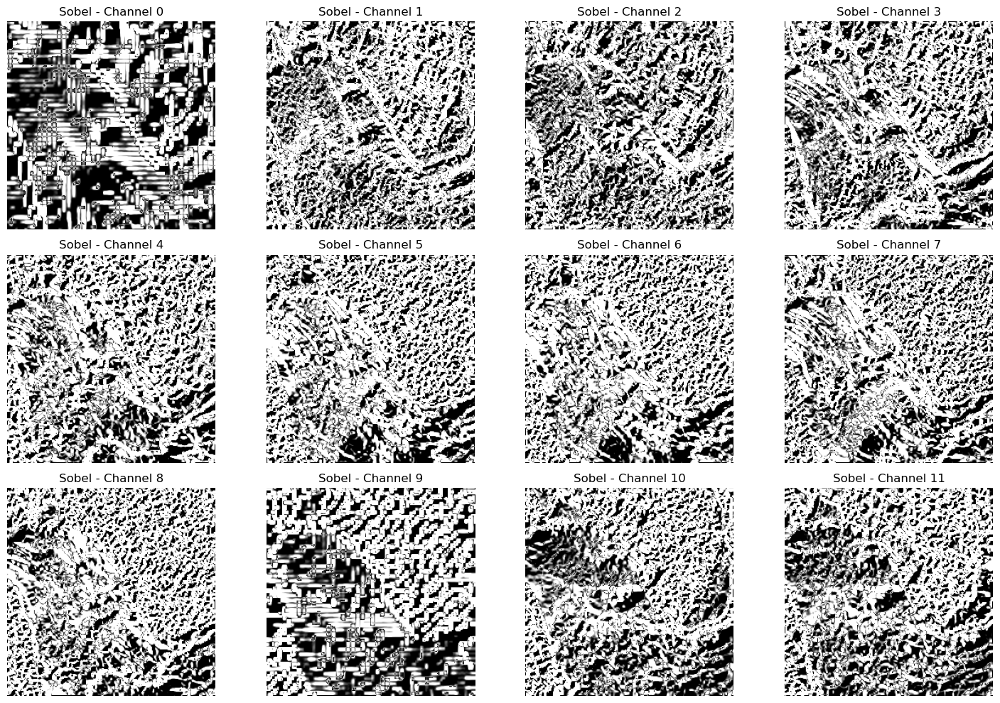

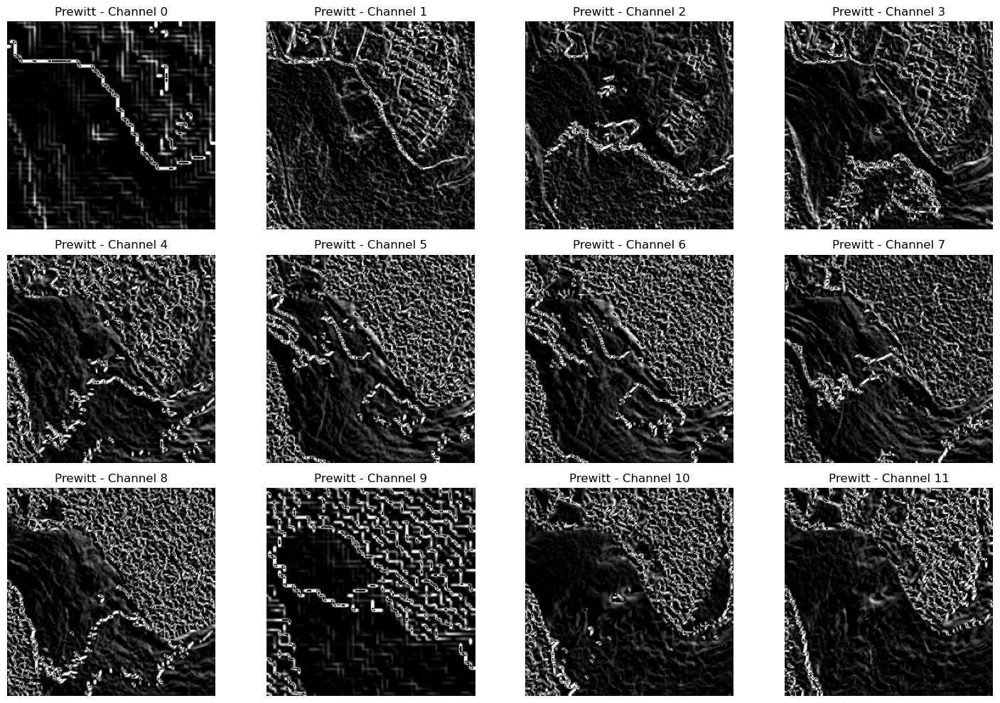

In [6]:
# Preprocess images
preprocess_input = input_images.copy()
preprocess_input = [preprocess(img, toggle=[True, True, False]) for img in preprocess_input]

# Apply edge detection
canny = [canny_ed(img) for img in preprocess_input]
scharr = [scharr_ed(img) for img in preprocess_input]
sobel = [sobel_ed(img) for img in preprocess_input]
prewitt = [prewitt_ed(img) for img in preprocess_input]

# Visualize edge detection

# Generate a random integer within the valid range of your dataset
rint = random.randint(0, min(len(rgb_images), len(labels), len(edge_reference), len(input_images)) - 1)
print(f"Random index: {rint}")

# Create a figure with 3 subplots for RGB, Label, and Reference images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot the RGB image
axs[0].imshow(rgb_images[rint])
axs[0].set_title("RGB image")
axs[0].axis("off")

# Plot the label
axs[1].imshow(labels[rint], cmap='gray')
axs[1].set_title("Label")
axs[1].axis("off")

# Plot the edge reference
axs[2].imshow(edge_reference[rint], cmap='gray')
axs[2].set_title("Reference")
axs[2].axis("off")

plt.tight_layout()
plt.show()

# Plot all channels for each of the specified data arrays
plot_all_channels(input_images[rint], "Original Input")
plot_all_channels(preprocess_input[rint], "Preprocessed Input")
plot_all_channels(canny[rint], "Canny")
plot_all_channels(scharr[rint], "Scharr")
plot_all_channels(sobel[rint], "Sobel")
plot_all_channels(prewitt[rint], "Prewitt")

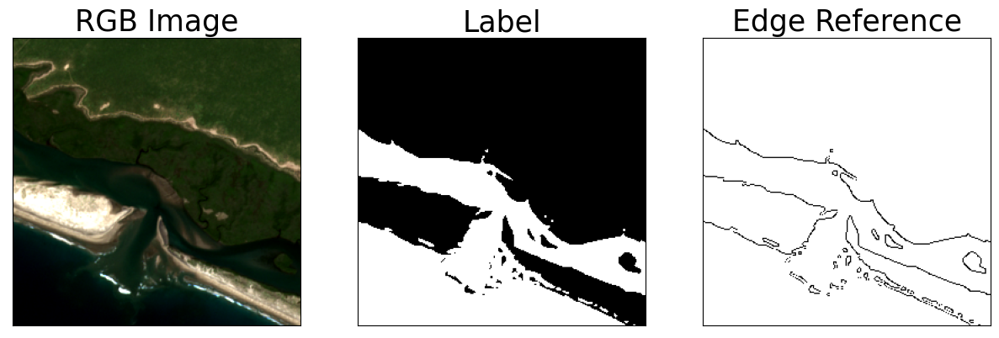

In [7]:
save_path = "../data/SWED/figures/{}"

# Example of a test image and label
rint = 0
fig, axs = plt.subplots(1, 3, figsize=(15, 15))

axs[0].imshow(rgb_images[rint])
axs[0].set_title("RGB Image", size=25)

axs[1].imshow(labels[rint], cmap="gray")
axs[1].set_title("Label", size=25)

axs[2].imshow(255 - edge_reference[rint], cmap="gray")
axs[2].set_title("Edge Reference", size=25)

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

plt.savefig(save_path.format("text_example"), bbox_inches='tight')

##CREATE A FUnction to automatically generate label image from rgb_images

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Define U-Net model
def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv4], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(up6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(up7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), conv2], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(up8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(up9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs=[inputs], outputs=[conv10])

    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Prepare the data
def preprocess_data(images, labels, img_size=(256, 256)):
    images_resized = [cv2.resize(img, img_size) for img in images]
    labels_resized = [cv2.resize(lbl, img_size) for lbl in labels]
    
    images_resized = np.array(images_resized) / 255.0
    labels_resized = np.array(labels_resized) / 255.0
    
    labels_resized = np.expand_dims(labels_resized, axis=-1) # Add channel dimension
    
    return images_resized, labels_resized

# Example data
rgb_images = [cv2.imread('path_to_rgb_image')] # replace with actual image loading
labels = [cv2.imread('path_to_label_image', 0)] # replace with actual label loading

# Preprocess the data
X, y = preprocess_data(rgb_images, labels)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the model
model = unet_model()

# Define callbacks
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ModelCheckpoint('unet_model.h5', verbose=1, save_best_only=True, save_weights_only=True)
]

# Train the model
history = model.fit(X_train, y_train, batch_size=8, epochs=50, callbacks=callbacks, validation_data=(X_val, y_val))

# Plot training history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Function to generate label from RGB image using trained model
def generate_label(image, model):
    img_resized = cv2.resize(image, (256, 256))
    img_resized = img_resized / 255.0
    img_resized = np.expand_dims(img_resized, axis=0)
    
    pred = model.predict(img_resized)
    pred = (pred > 0.5).astype(np.uint8)
    pred = np.squeeze(pred, axis=0)
    
    pred_resized = cv2.resize(pred, (image.shape[1], image.shape[0]))
    
    return pred_resized

# Example usage
example_image = rgb_images[0] # Replace with actual image
generated_label = generate_label(example_image, model)

# Display the result
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(example_image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Generated Label')
plt.imshow(generated_label, cmap='gray')
plt.axis('off')

plt.show()
